In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#import sys
# Insert folder in case import does not find code
#sys.path.append('')

# Load Data

In [3]:
import pandas as pd

In [4]:
from model.base import Book, Passage, Match, NarratorType
from model.io import parse_csv

data = parse_csv('data/Matches_v4_08.2020 - matches_v4.csv')

In [5]:
m = data.matches[50]
m.left

Passage(book=Book(shorthand='domenico', author='Domenico Bernini', title='TEST', year=1713, structure=<class 'list'>), begin_c=86518, end_c=86882, image_number=70, text="ar principio all'altro, e molte volte a molti inſieme, tenendo in continuo moto l'ingegno, e l'opera del Cavaliere. Portava Urbano fin da Cardinale una profonda venerazione alla Memoria Depoſito illuſtre della Conteſſa Matilde,che generoſamente dotò della Conteſſa Matil. la Sede Apoſtolica con l'accreſcimento di molti Stati, che ſi diſſero Patrimonio di S. Pietr", entities=[], works=[], form=[], content=[], grouping=None, service=None, place=None)

In [6]:
all_entities = list({e.name for m in data.matches for e in m.all_entities})

In [7]:
all_entities

['Giovanni Battista Contini',
 'Visitor',
 'Plauto',
 'Pontiff Alessandro VII',
 'Guilio Cartari',
 'Carlo Maderno',
 'Cardinal Azzolino',
 'Pontiff Urbano VIII',
 'Raffaello',
 'Pietro Bernini',
 'Cardinal Flavio Chigi',
 'Cardinals of the Congregazione della Fabrica',
 "Mattia de' Rossi",
 'Monsignor Carlo Roberti',
 'Stefano Speranza',
 'Secret Counsil',
 "Bernini's brother Vincenzo",
 'Cardinal Monsignor Fabio Chigi',
 'Donna Olimpia',
 'Pamfilia family',
 'Cardinal Armando di Richelieu',
 'Cardinal Mazarini',
 'Monsignor Giacomo Montoya/Montoia',
 '[]',
 'Prince Ludovisio',
 "Bernini's disciples",
 'Tiziano',
 'Grand Duke of Tuscany',
 'Giulio Cartari',
 'Secret Coucil',
 'Andrea Bolgi',
 'Terenzio',
 "Bernini's wife",
 "Bernini's brother Luigi Bernini",
 'Cardinal Bellarmino ',
 'Congregazione della Fabrica',
 'Giacomo Antonio Fancelli',
 'Giovanni Antonio Mari',
 'Monsù Adamo',
 'Cardinal Panzirolo',
 'Baldassarre Peruzzi',
 'Cosimo Scarlatti',
 "Bernini's Oponents",
 "Bernini's

In [8]:
king_entities = {e for e in all_entities if e.startswith('King')}
king_entities

{'King of England Carlos I',
 'King of France Luigi XIII',
 'King of France Luigi XIV',
 'King of Spain Filippo IV'}

In [9]:
[m for m in data.matches if any((e.name == 'Giulio Cesare' for e in m.all_entities))]

[Match(id=129, meta={'tags': "['v4']", 'similarity': 0.368, 'reordered': True}, left=Passage(book=Book(shorthand='domenico', author='Domenico Bernini', title='TEST', year=1713, structure=<class 'list'>), begin_c=196013, end_c=196275, image_number=137, text="l Cavaliere. L'uno fù il Cav. Mattia de Roſſi, l'altro Giulio Cartarè ambedue Romani, il primo di gran nome nell'Architettura , il ſecondo di buona maniera nella Scultura . Figlio era quegli di Marc'Antonio de Roſſi buonº Architetto del ſuo tempo, e che doppo ſu", entities=[EntityMention(name="Mattia de' Rossi", confident=True), EntityMention(name='Giulio Cesare', confident=True), EntityMention(name="Marc'Antonio de' Rossi", confident=True)], works=[], form=['running text'], content=['mention'], grouping=None, service=None, place=None), right=Passage(book=Book(shorthand='baldinucci', author='Baldinucci', title='TEST', year=1682, structure=<class 'list'>), begin_c=107532, end_c=107812, image_number=61, text="L CAVALIER BERNINO. 45 ſe

# Plot

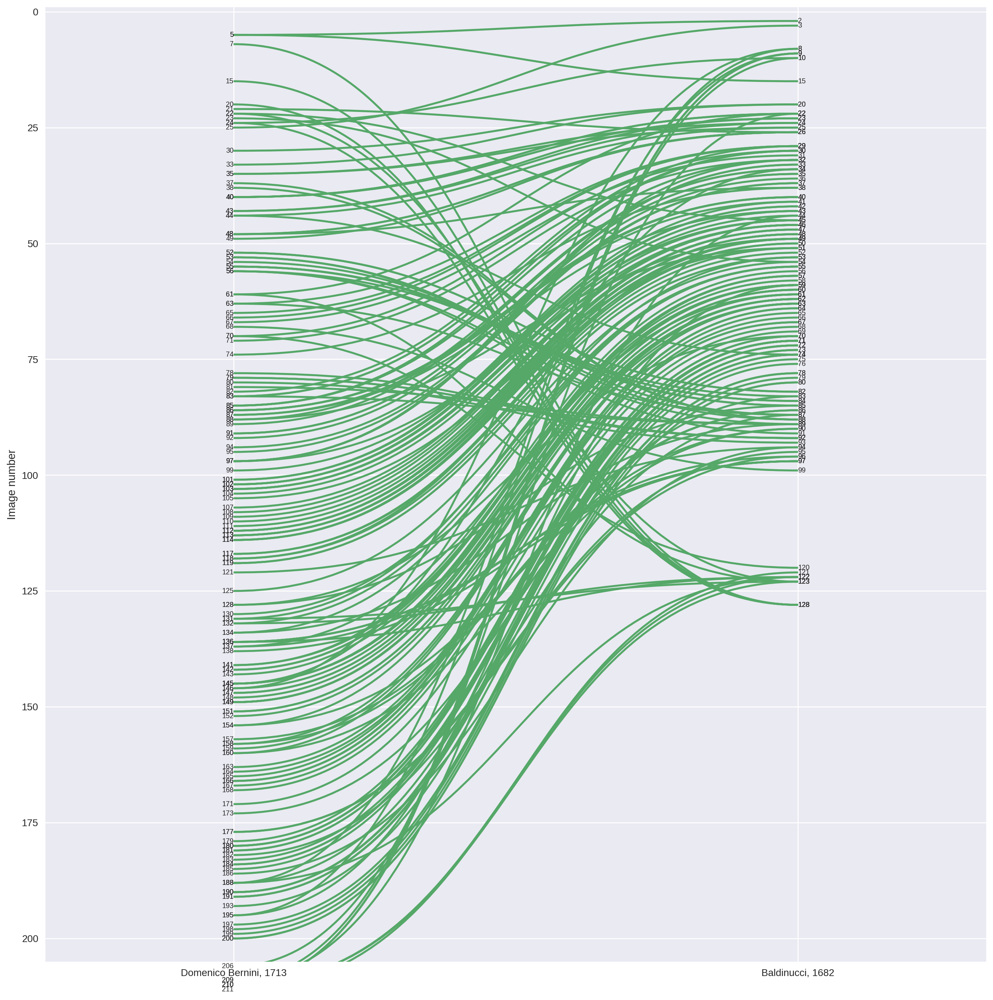

In [10]:
import matplotlib.pyplot as plt
plt.style.use('seaborn')

from visualisation.matches import side_matching_plot

fig = side_matching_plot(data)

In [11]:
keep_fn = lambda m: not m.irrelevant

def keep_fn2(m):
    return not m.irrelevant

highlight_fn = lambda m: m.meta['reordered']

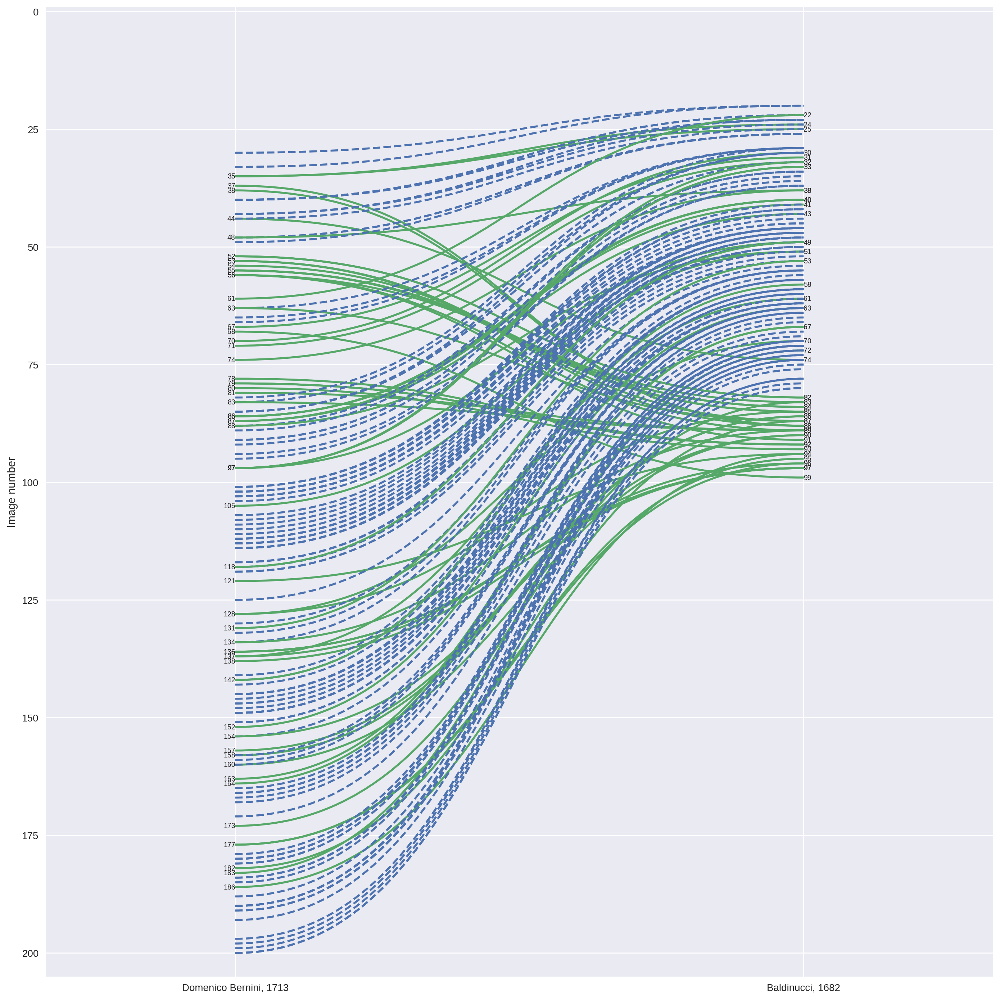

In [12]:
fig = side_matching_plot(data, keep_fn=keep_fn2, highlight_fn=highlight_fn)

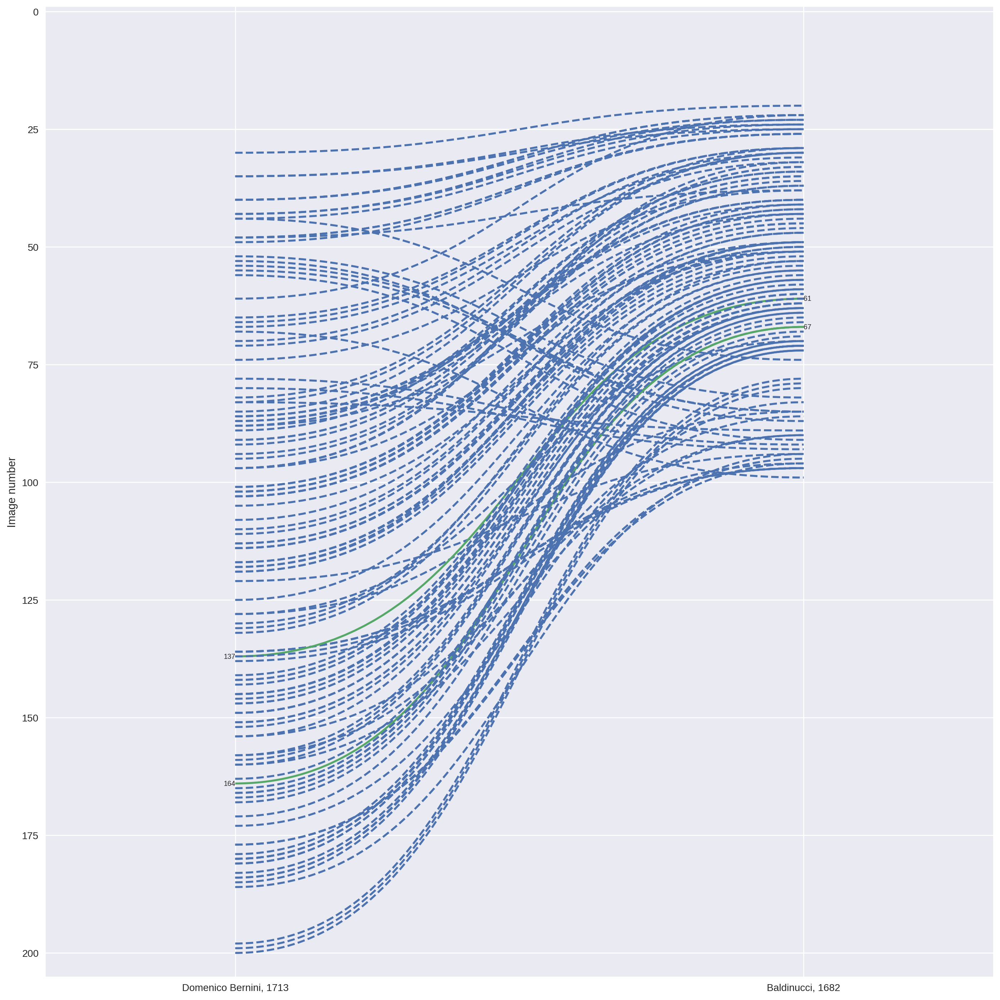

In [13]:
# Show matches with at least one entity, highlighting the ones with Giulio Cesare
fig = side_matching_plot(data,
                         keep_fn=lambda m: len(m.all_entities) > 0,
                         highlight_fn=lambda m: any((e.name == 'Giulio Cesare' for e in m.all_entities)))

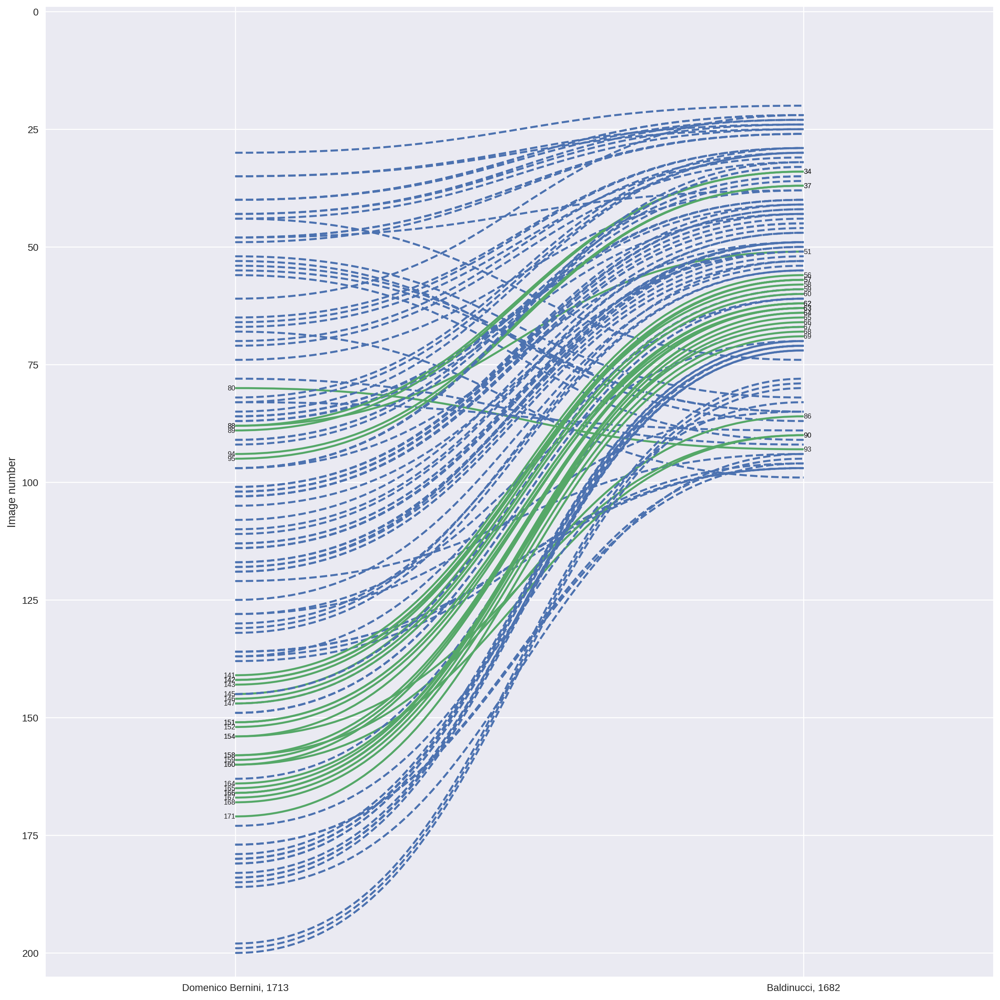

In [14]:
# Show matches with at least one entity, highlighting the ones with Giulio Cesare
fig = side_matching_plot(data,
                         keep_fn=lambda m: len(m.all_entities) > 0,
                         highlight_fn=lambda m: any((e.name in king_entities for e in m.all_entities)))

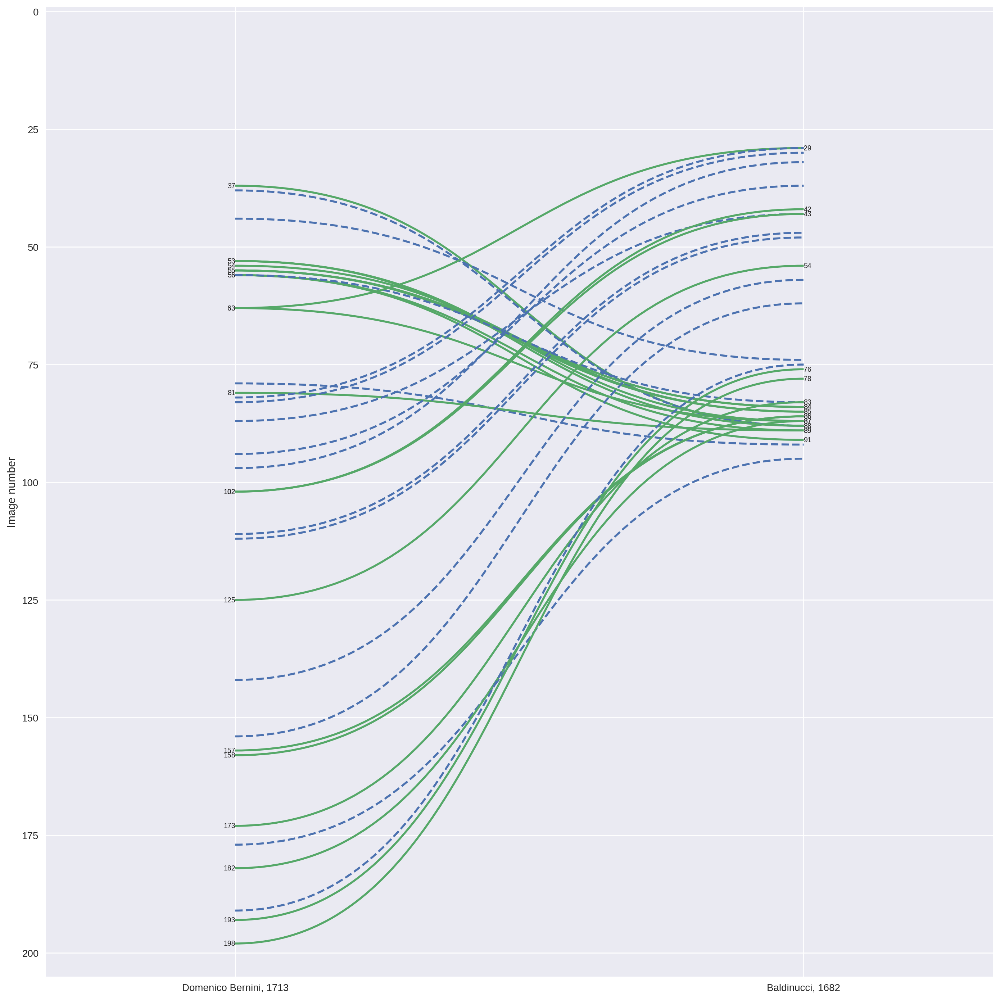

In [15]:
# Show matches with at least one entity, highlighting the ones with Giulio Cesare
fig = side_matching_plot(data,
                         keep_fn=lambda m: m.left.narrator or m.right.narrator ,
                         highlight_fn=lambda m: m.left.narrator == NarratorType.BERNINI)

# Data Analysis

In [16]:
import seaborn as sns

In [17]:
df = pd.DataFrame(data=[{'id': m.id, 'match': m} for m in data.matches if not m.irrelevant])
df = df.set_index('id')

In [18]:
df

,match
id,
13,"Match(id=13, meta={'tags': ""['noseg', 'v3', 'v..."
14,"Match(id=14, meta={'tags': ""['noseg', 'v3', 'v..."
15,"Match(id=15, meta={'tags': ""['v4']"", 'similari..."
16,"Match(id=16, meta={'tags': ""['seg', 'v3']"", 's..."
17,"Match(id=17, meta={'tags': ""['seg', 'v3', 'v4'..."
...,...
196,"Match(id=196, meta={'tags': ""['noseg', 'seg', ..."
197,"Match(id=197, meta={'tags': ""['v2', 'v4']"", 's..."
198,"Match(id=198, meta={'tags': ""['v4']"", 'similar..."


In [19]:
def is_letter(m: Match):
    return any((f == 'letter' for f in m.form))

def different_form(m: Match):
    return len(set(m.left.form).symmetric_difference(m.right.form)) > 0

df['is_letter'] = df.match.apply(is_letter)
df['different_form'] = df.match.apply(different_form)
df['left_form'] = df.match.apply(lambda m: m.left.form)
df['right_form'] = df.match.apply(lambda m: m.right.form)

In [20]:
df.is_letter.value_counts()

False    159
True      15
Name: is_letter, dtype: int64

In [21]:
df[df.different_form]

,match,is_letter,different_form,left_form,right_form
id,,,,,
17,"Match(id=17, meta={'tags': ""['seg', 'v3', 'v4'...",False,True,"[running text, quote]","[running text, indirect quote]"
19,"Match(id=19, meta={'tags': ""['v4']"", 'similari...",False,True,[running text],"[running text, quote]"
20,"Match(id=20, meta={'tags': ""['v2', 'v4']"", 'si...",False,True,[running text],"[running text, quote]"
27,"Match(id=27, meta={'tags': ""['seg', 'v3', 'v4'...",False,True,[chapter],[running text]
34,"Match(id=34, meta={'tags': ""['seg', 'v3', 'v4'...",False,True,"[running text, quote]","[running text, indirect quote]"
37,"Match(id=37, meta={'tags': ""['v4']"", 'similari...",False,True,[quote],[indirect quote]
38,"Match(id=38, meta={'tags': ""['v2']"", 'similari...",False,True,[quote],[indirect quote]
39,"Match(id=39, meta={'tags': ""['seg', 'v2', 'v3'...",False,True,[quote],[indirect quote]
44,"Match(id=44, meta={'tags': ""['noseg', 'v3', 'v...",False,True,[quote],[indirect quote]


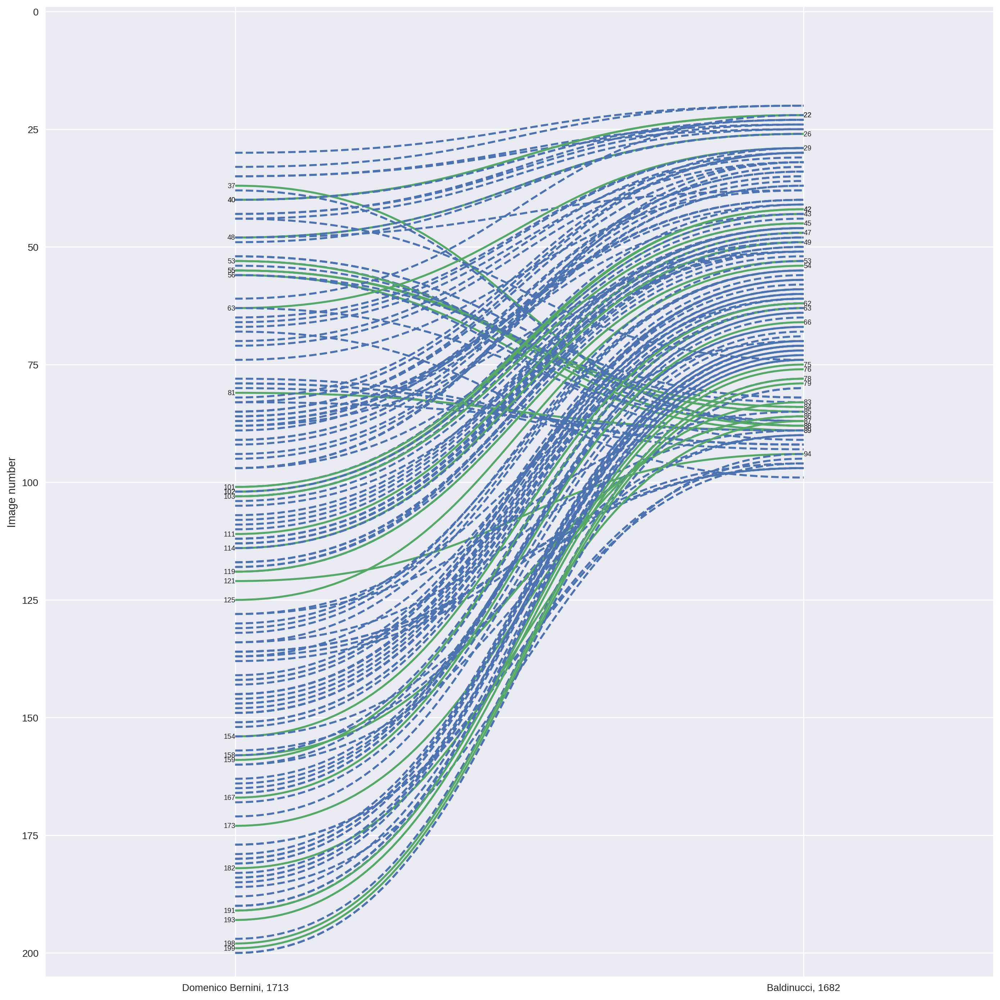

In [22]:
# Show matches with different form
fig = side_matching_plot(data,
                         keep_fn=lambda m: not m.irrelevant ,
                         highlight_fn=different_form)